<a href="https://colab.research.google.com/github/matt322/diffusionmodel/blob/main/diffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torch import nn
import torch.nn.functional as F
from torch.optim import Adam
import numpy as np
import math
import time
device = "cuda" if torch.cuda.is_available() else "cpu"


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Noise Scheduler

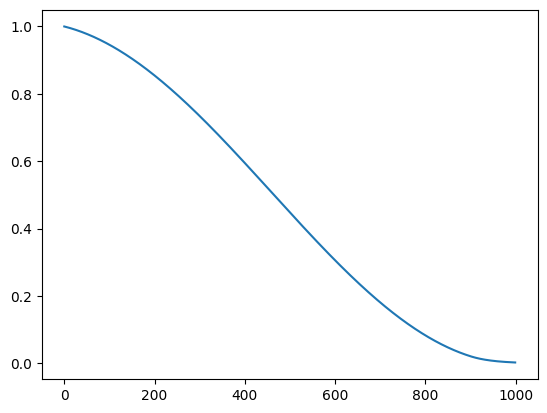

In [3]:
timesteps = 1000
s = 0.08
def f(t):
    return np.power(np.cos(((t / timesteps + s) / (1 + s)) * (np.pi / 2)), 2)
def beta(t):
    return min(1 - f(t) / f(t-1), 0.02)

noise_schedule = torch.tensor([beta(t) for t in range(timesteps)], device=device, dtype=torch.float)
#noise_schedule = torch.linspace(0.0001, 0.02, timesteps, device=device)
alphas = torch.cumprod(1 - noise_schedule, axis=0).to(device)
root_alphas = torch.sqrt(alphas).to(device)
root_alphas_dec = torch.sqrt(1 - alphas).to(device)
root_recip_alphas = 1 / torch.sqrt(1-noise_schedule).to(device)
post_var = noise_schedule * (1 - torch.nn.functional.pad(alphas[:-1], (1, 0), value=1.0)) / (1 - alphas).to(device)
plt.plot(alphas.to('cpu'))



def get_noise(x, t):
    noise = torch.randn_like(x)
    a = torch.index_select(root_alphas, 0, t).to(device)
    a = a[:, None, None, None]
    b = torch.index_select(root_alphas_dec, 0, t).to(device)
    b = b[:, None, None, None]
    return (a * x + b * noise).to(device), noise.to(device)

In [ ]:
batch = next(iter(data_loader))
start_time = time.time()
t = torch.randint(0, timesteps, (batch_size,), device=device)
x_noise, noise = get_noise(batch[0].to(device), t)
end_time = time.time()

execution_time = end_time - start_time
print(f"Execution Time: {execution_time} seconds")

NameError: ignored

Dataset

In [4]:
!unzip '/content/drive/MyDrive/Colab Notebooks/faces.zip'

Streaming output truncated to the last 5000 lines.
  inflating: faces/thumbnails128x128/65003.png  
  inflating: faces/thumbnails128x128/65004.png  
  inflating: faces/thumbnails128x128/65005.png  
  inflating: faces/thumbnails128x128/65006.png  
  inflating: faces/thumbnails128x128/65007.png  
  inflating: faces/thumbnails128x128/65008.png  
  inflating: faces/thumbnails128x128/65009.png  
  inflating: faces/thumbnails128x128/65010.png  
  inflating: faces/thumbnails128x128/65011.png  
  inflating: faces/thumbnails128x128/65012.png  
  inflating: faces/thumbnails128x128/65013.png  
  inflating: faces/thumbnails128x128/65014.png  
  inflating: faces/thumbnails128x128/65015.png  
  inflating: faces/thumbnails128x128/65016.png  
  inflating: faces/thumbnails128x128/65017.png  
  inflating: faces/thumbnails128x128/65018.png  
  inflating: faces/thumbnails128x128/65019.png  
  inflating: faces/thumbnails128x128/65020.png  
  inflating: faces/thumbnails128x128/65021.png  
  inflating: faces

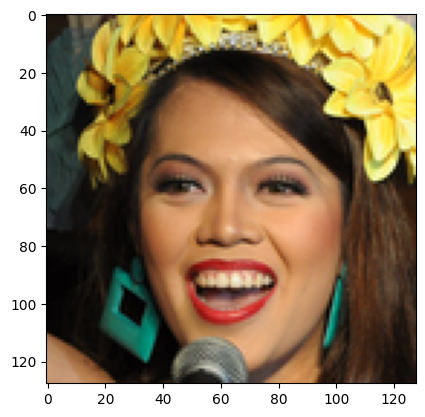

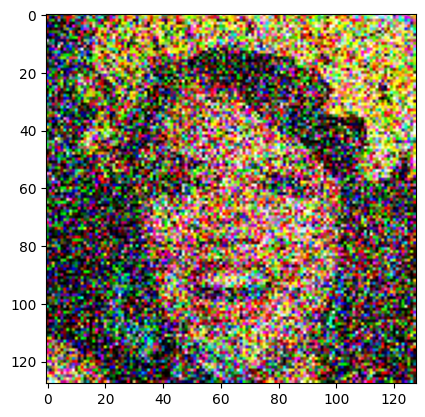

In [5]:
transform = transforms.Compose([
    transforms.ToTensor(),
    #transforms.Resize((64,64))
])
batch_size = 16
dataset = ImageFolder(root='faces', transform=transform)
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True)

batch_images, batch_labels = next(iter(data_loader))
image = batch_images[0].to(device)
n = get_noise(image, torch.tensor([256], device=device))[0][0].to("cpu")
image_np = np.transpose(image.to("cpu").numpy(), (1, 2, 0))
n_np = np.transpose(n.numpy(), (1, 2, 0))

plt.imshow(image_np)
plt.show()
plt.imshow(n_np)
plt.show()

Network

In [6]:
class Block(nn.Module):
    def __init__(self, prev_chans, chans, down=True, use_trans = True, use_attn = False):
        super().__init__()
        self.time = Embedding(chans)
        self.c2 = nn.Conv2d(in_channels=chans, out_channels=chans, kernel_size=3, padding=1)
        self.silu = nn.SiLU()
        self.norm1 = nn.GroupNorm(32, chans)
        self.norm2 = nn.GroupNorm(32, chans)
        self.use_attn = use_attn
        self.use_trans = use_trans
        self.dropout = nn.Dropout(0.1)
        if use_attn:
            self.attn = Attention(chans)

        if down:
            self.trans = nn.Conv2d(chans, chans, 4, 2, 1)
            self.c1 = nn.Conv2d(in_channels=prev_chans, out_channels=chans, kernel_size=3, padding=1)
            if prev_chans != chans:
                self.shortcut = nn.Conv2d(prev_chans, chans, 1)
            else:
                self.shortcut = nn.Identity()
        else:
            self.trans = nn.ConvTranspose2d(chans, chans, 4, 2, 1)
            self.c1 = nn.Conv2d(in_channels=prev_chans*2, out_channels=chans, kernel_size=3, padding=1)
            if prev_chans*2 != chans:
                self.shortcut = nn.Conv2d(prev_chans*2, chans, 1)
            else:
                self.shortcut = nn.Identity()


    def forward(self, x, t, residual=None):
        if residual == None:
            h = self.dropout(self.norm1(self.silu(self.c1(x))))
        else:
            x = torch.cat((x, residual), dim=1)
            h = self.dropout(self.norm1(self.silu(self.c1(x))))
        t = self.time(t)
        h += t[..., None, None]
        h = self.norm2(self.dropout(self.silu(self.c2(h))))
        h += self.shortcut(x)
        if self.use_attn:
            h = self.attn(h)
        if self.use_trans:
            return self.trans(h), h
        return h, None

class Attention(nn.Module):
    def __init__(self, n_channels: int, n_heads: int = 4, d_k: int = None, n_groups: int = 32):
        super().__init__()
        if d_k is None:
            d_k = n_channels
        self.norm = nn.GroupNorm(n_groups, n_channels)
        self.projection = nn.Linear(n_channels, n_heads * d_k * 3)
        self.output = nn.Linear(n_heads * d_k, n_channels)
        self.scale = d_k ** -0.5
        self.n_heads = n_heads
        self.d_k = d_k

    def forward(self, x: torch.Tensor):
        batch_size, n_channels, height, width = x.shape
        # Change `x` to shape `[batch_size, seq, n_channels]`
        x = x.view(batch_size, n_channels, -1).permute(0, 2, 1)
        # Get query, key, and values (concatenated) and shape it to `[batch_size, seq, n_heads, 3 * d_k]`
        qkv = self.projection(x).view(batch_size, -1, self.n_heads, 3 * self.d_k)
        # Split query, key, and values. Each of them will have shape `[batch_size, seq, n_heads, d_k]`
        q, k, v = torch.chunk(qkv, 3, dim=-1)
        # Calculate scaled dot-product $\frac{Q K^\top}{\sqrt{d_k}}$
        attn = torch.einsum('bihd,bjhd->bijh', q, k) * self.scale
        # Softmax along the sequence dimension $\underset{seq}{softmax}\Bigg(\frac{Q K^\top}{\sqrt{d_k}}\Bigg)$
        attn = attn.softmax(dim=2)
        # Multiply by values
        res = torch.einsum('bijh,bjhd->bihd', attn, v)
        # Reshape to `[batch_size, seq, n_heads * d_k]`
        res = res.reshape(batch_size, -1, self.n_heads * self.d_k)
        # Transform to `[batch_size, seq, n_channels]`
        res = self.output(res)

        # Add skip connection
        res += x

        # Change to shape `[batch_size, in_channels, height, width]`
        res = res.permute(0, 2, 1).view(batch_size, n_channels, height, width)

        #
        return res


class Embedding(nn.Module):
    def __init__(self, n_channels: int):
        super().__init__()
        self.n_channels = n_channels
        self.lin1 = nn.Linear(self.n_channels // 4, self.n_channels)
        self.silu = nn.SiLU()
        self.lin2 = nn.Linear(self.n_channels, self.n_channels)

    def forward(self, t: torch.Tensor):
        half_dim = self.n_channels // 8
        emb = math.log(10_000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=t.device) * -emb)
        emb = t[:, None] * emb[None, :]
        emb = torch.cat((emb.sin(), emb.cos()), dim=1)

        # Transform with the MLP
        emb = self.silu(self.lin1(emb))
        emb = self.lin2(emb)

        #
        return emb


class Unet(nn.Module):
    def __init__(self):
        super().__init__()
        c = 96
        down_channels = (c, c, 2*c, 2*c, 4*c, 4*c)
        up_channels = (4*c, 4*c, 2*c, 2*c, c, c)
        use_attn = (False, False, True, True)
        self.attn = Attention(8*c)
        self.downs = nn.ModuleList([
                                    Block(down_channels[0], down_channels[0], use_attn=use_attn[0], use_trans=False),
                                    Block(down_channels[0], down_channels[1], use_attn=use_attn[0]),
                                    Block(down_channels[1], down_channels[2], use_attn=use_attn[1], use_trans=False),
                                    Block(down_channels[2], down_channels[3], use_attn=use_attn[1]),
                                    Block(down_channels[3], down_channels[4], use_attn=use_attn[2], use_trans=False),
                                    Block(down_channels[4], down_channels[5], use_attn=use_attn[2])
                                    ])
        self.ups = nn.ModuleList([
                                    Block(up_channels[0], up_channels[1], use_attn=use_attn[2], use_trans=False, down=False),
                                    Block(up_channels[1]//2, up_channels[2], use_attn=use_attn[2], down=False),
                                    Block(up_channels[2], up_channels[3], use_attn=use_attn[1], use_trans=False, down=False),
                                    Block(up_channels[3]//2, up_channels[4], use_attn=use_attn[1], down=False),
                                    Block(up_channels[4], up_channels[5], use_attn=use_attn[0], use_trans=False, down=False),
                                    Block(up_channels[5]//2, up_channels[5], use_attn=use_attn[0], down=False, use_trans=False)
                                    ])
        self.output = nn.Conv2d(up_channels[-1], 3, 1)
        self.start = nn.Conv2d(3, c, 3, padding=1)
        self.embed = Embedding(32)
        self.middle = nn.ModuleList([
            Block(4*c, 8*c, use_attn=True, use_trans=False),
            Block(4*c, 4*c, use_attn=False, down=False)
        ])

    def forward(self, x, t):
        x = self.start(x)
        residuals = []
        for i,d in enumerate(self.downs):
            x = d(x, t)
            if i % 2 == 1:
                residuals.append(x[1])
            x = x[0]

        x = self.middle[0](x, t)[0]
        x = self.middle[1](x, t)[0]
        for i,d in enumerate(self.ups):
            if i % 2 == 0:
                x = d(x, t, residuals.pop())[0]
            else:
                x = d(x, t)[0]
        return self.output(x)





In [10]:
loss = nn.MSELoss()
model = Unet()
model.to(device)
model.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/diffusion_model_25-1-1000'))
print("Num params: ", sum(p.numel() for p in model.parameters()))
model(torch.randn((16, 3, 64, 64), device=device), torch.randn((16), device=device)).shape

Num params:  76190211


torch.Size([16, 3, 64, 64])

Sample

In [8]:
@torch.no_grad()
def sample(x, t):
    mean = root_recip_alphas[t] * (x - noise_schedule[t] * model(x, t) / root_alphas_dec[t])
    if t == 0:
        return mean
    noise = torch.randn_like(x)
    return mean + torch.sqrt(post_var[t]) * noise

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.to("cpu").numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

@torch.no_grad()
def plot_image():
    img = torch.randn((1, 3, 128, 128), device = device)
    plt.figure(figsize=(20,20))
    step = int(timesteps/10)
    model.eval()
    for i in range(0, timesteps)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample(img, t)
        if i % step == 0:
            plt.subplot(1, 10, int(i/step)+1)
            show_tensor_image(img)
    plt.show()

@torch.no_grad()
def plot_image_full():
    img = torch.randn((1, 3, 128, 128), device = device)
    model.eval()
    for i in range(0, timesteps)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample(img, t)
    show_tensor_image(img)
    plt.show()

#plot_image()


Training

Epoch 0, step 0, loss 8.632621727883816e-05


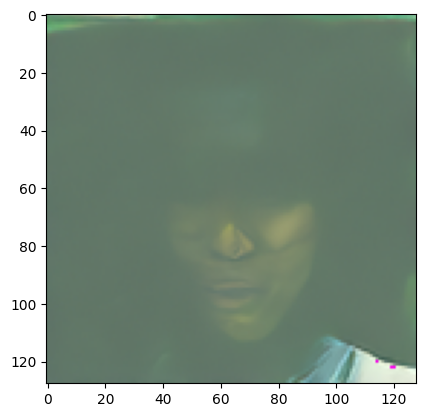

Epoch 0, step 50, loss 0.013574951300397516
Epoch 0, step 100, loss 0.012571232002228499
Epoch 0, step 150, loss 0.01404919557273388
Epoch 0, step 200, loss 0.012403823863714934
Epoch 0, step 250, loss 0.013610233664512634
Epoch 0, step 300, loss 0.014207934392616153


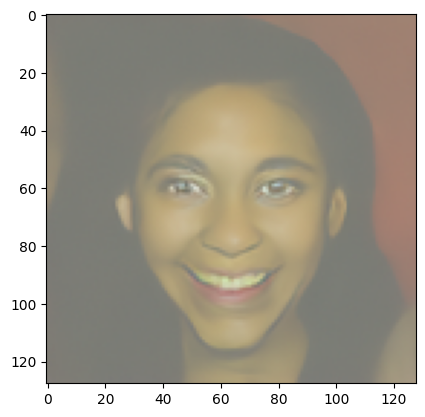

Epoch 0, step 350, loss 0.013369461102411152
Epoch 0, step 400, loss 0.012759282672777771
Epoch 0, step 450, loss 0.014269294207915664
Epoch 0, step 500, loss 0.012522917930036783
Epoch 0, step 550, loss 0.013459114544093608
Epoch 0, step 600, loss 0.013347614919766784


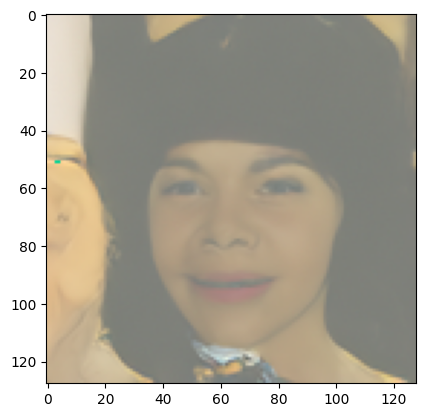

Epoch 0, step 650, loss 0.013039865368045866
Epoch 0, step 700, loss 0.015271044578403234
Epoch 0, step 750, loss 0.013479452049359679
Epoch 0, step 800, loss 0.0133647530246526
Epoch 0, step 850, loss 0.012263118671253324
Epoch 0, step 900, loss 0.013426629211753607


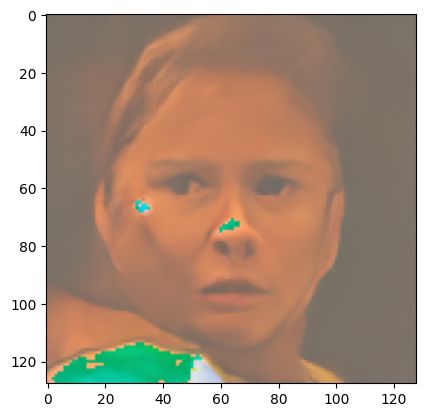

Epoch 0, step 950, loss 0.0139858712349087
Epoch 0, step 1000, loss 0.013716433010995389
Epoch 0, step 1050, loss 0.01299054161645472
Epoch 0, step 1100, loss 0.013185016838833689
Epoch 0, step 1150, loss 0.013502054195851088
Epoch 0, step 1200, loss 0.012333850739523769


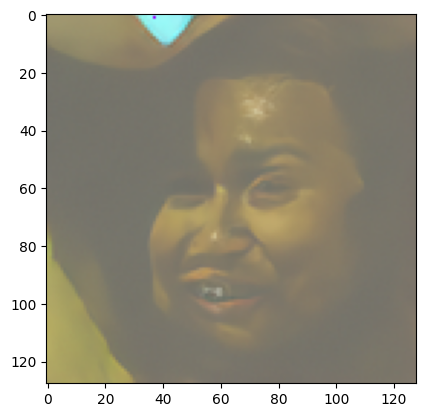

Epoch 0, step 1250, loss 0.014143219687975944
Epoch 0, step 1300, loss 0.01483830314129591
Epoch 0, step 1350, loss 0.012314900225028395
Epoch 0, step 1400, loss 0.013780313655734061
Epoch 0, step 1450, loss 0.012878024224191905
Epoch 0, step 1500, loss 0.013602613480761647


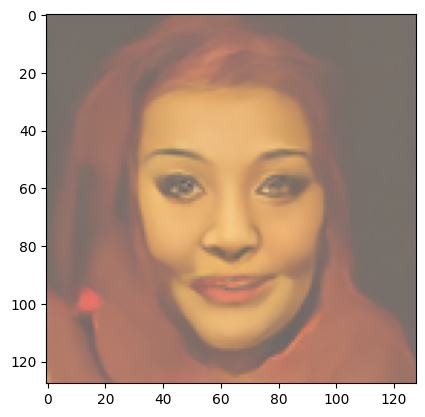

Epoch 0, step 1550, loss 0.012814674424007536
Epoch 0, step 1600, loss 0.013138936506584287
Epoch 0, step 1650, loss 0.011999077862128615
Epoch 0, step 1700, loss 0.013437410797923804
Epoch 0, step 1750, loss 0.014209380242973566
Epoch 0, step 1800, loss 0.0120294991414994


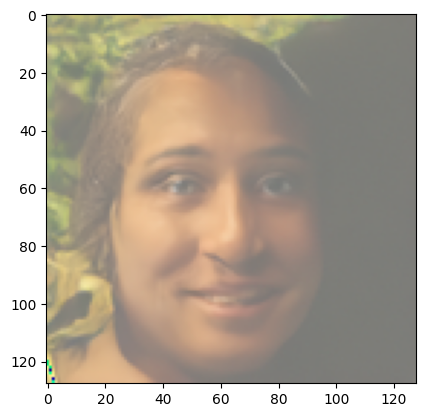

Epoch 0, step 1850, loss 0.013252334203571081
Epoch 0, step 1900, loss 0.012225502952933311
Epoch 0, step 1950, loss 0.01273315970785916
Epoch 0, step 2000, loss 0.012812491171061993
Epoch 0, step 2050, loss 0.011419613873586058
Epoch 0, step 2100, loss 0.013034718949347735


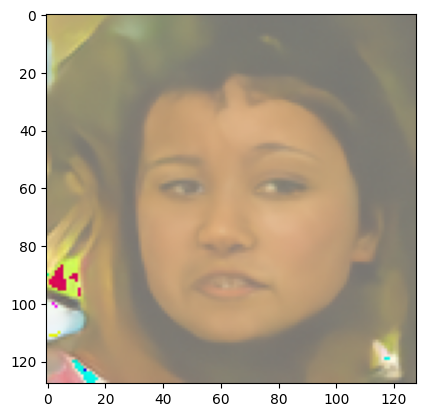

Epoch 0, step 2150, loss 0.01288464224897325
Epoch 0, step 2200, loss 0.01300157151184976
Epoch 0, step 2250, loss 0.014079476920887828
Epoch 0, step 2300, loss 0.01124699012376368
Epoch 0, step 2350, loss 0.012817747024819255
Epoch 0, step 2400, loss 0.012882574275135995


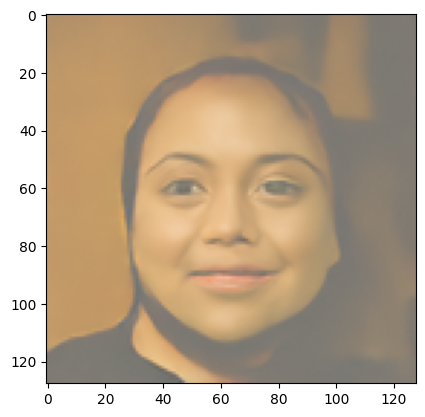

Epoch 0, step 2450, loss 0.013266124743968249
Epoch 0, step 2500, loss 0.012978363428264856
Epoch 0, step 2550, loss 0.012462623147293926
Epoch 0, step 2600, loss 0.01218033991754055
Epoch 0, step 2650, loss 0.012197940470650792
Epoch 0, step 2700, loss 0.013472876558080316


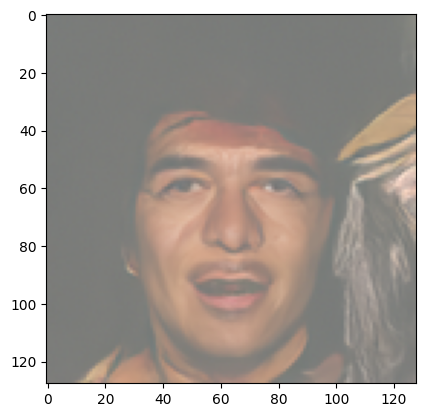

Epoch 0, step 2750, loss 0.01292202620767057
Epoch 0, step 2800, loss 0.013270109305158257
Epoch 0, step 2850, loss 0.013697713622823357
Epoch 0, step 2900, loss 0.014038956854492426
Epoch 0, step 2950, loss 0.01183264165185392
Epoch 0, step 3000, loss 0.013030342105776072


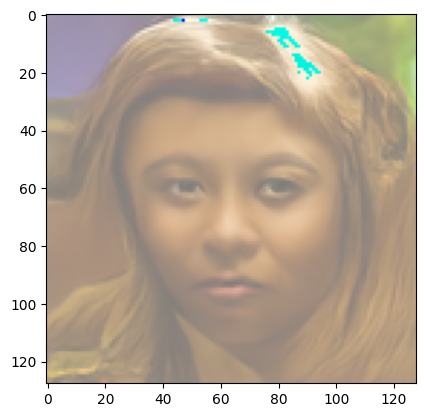

Epoch 0, step 3050, loss 0.014027945278212429
Epoch 0, step 3100, loss 0.012096386207267641
Epoch 0, step 3150, loss 0.012993306405842304
Epoch 0, step 3200, loss 0.011777067990042269
Epoch 0, step 3250, loss 0.012671876633539796
Epoch 0, step 3300, loss 0.013501514783129095


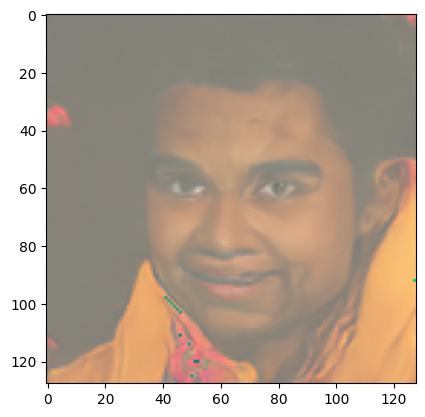

Epoch 0, step 3350, loss 0.012931937826797366
Epoch 0, step 3400, loss 0.012263108640909196
Epoch 0, step 3450, loss 0.01247446115128696
Epoch 0, step 3500, loss 0.012464678641408681
Epoch 0, step 3550, loss 0.014861477687954903
Epoch 0, step 3600, loss 0.013117112480103969


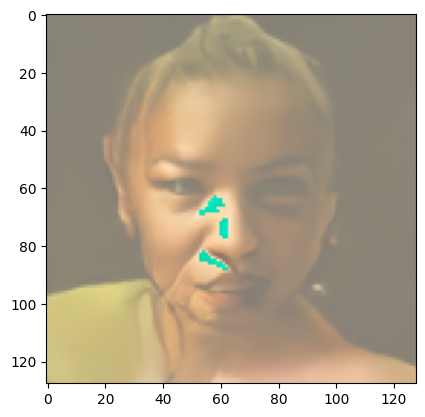

Epoch 0, step 3650, loss 0.014086968982592225
Epoch 0, step 3700, loss 0.012364931041374802
Epoch 0, step 3750, loss 0.011379254786297678
Epoch 0, step 3800, loss 0.012577575370669366
Epoch 0, step 3850, loss 0.014941075332462788
Epoch 0, step 3900, loss 0.011404779860749841


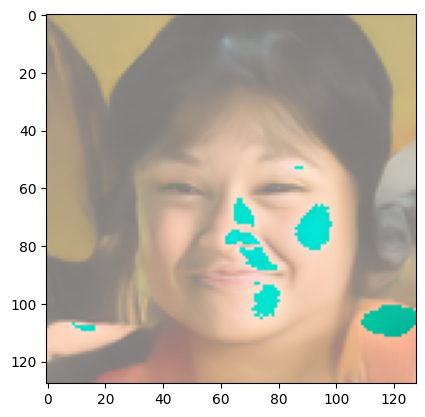

Epoch 0, step 3950, loss 0.013632813533768058
Epoch 0, step 4000, loss 0.013198414081707598
Epoch 0, step 4050, loss 0.013277275385335088
Epoch 0, step 4100, loss 0.013913933662697673
Epoch 0, step 4150, loss 0.012348008966073394
Epoch 0, step 4200, loss 0.013054909147322179


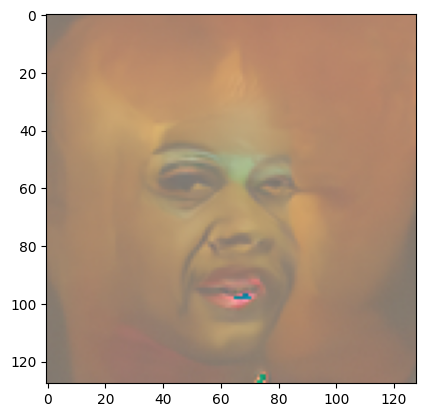

Epoch 0, step 4250, loss 0.012469439255073666
Epoch 0, step 4300, loss 0.012048700144514441
Epoch 0, step 4350, loss 0.012348750662058592
Epoch 1, step 0, loss 0.000370376817882061


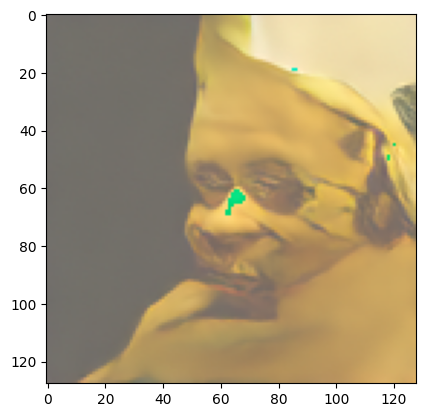

Epoch 1, step 50, loss 0.01234856982715428
Epoch 1, step 100, loss 0.013249605968594551
Epoch 1, step 150, loss 0.012690645614638925
Epoch 1, step 200, loss 0.013137422669678926
Epoch 1, step 250, loss 0.01270668669603765
Epoch 1, step 300, loss 0.011553615517914295


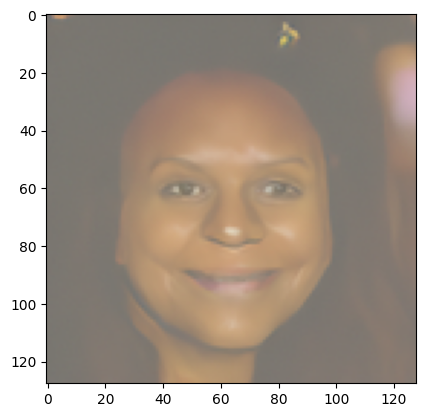

Epoch 1, step 350, loss 0.014067028127610683
Epoch 1, step 400, loss 0.014966580718755722
Epoch 1, step 450, loss 0.013095768503844737
Epoch 1, step 500, loss 0.014139727437868715
Epoch 1, step 550, loss 0.012553772581741214
Epoch 1, step 600, loss 0.01267251417040825


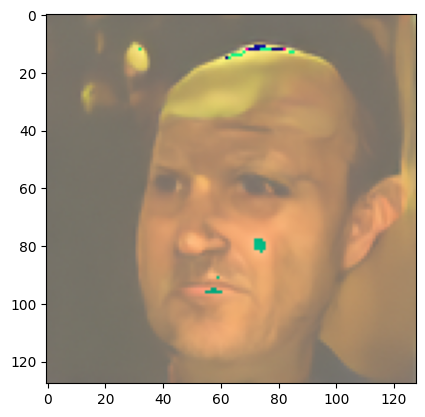

Epoch 1, step 650, loss 0.011999726239591836
Epoch 1, step 700, loss 0.012653675461187959
Epoch 1, step 750, loss 0.012271752366796135
Epoch 1, step 800, loss 0.013675635633990168
Epoch 1, step 850, loss 0.014195956289768219
Epoch 1, step 900, loss 0.013020374495536089


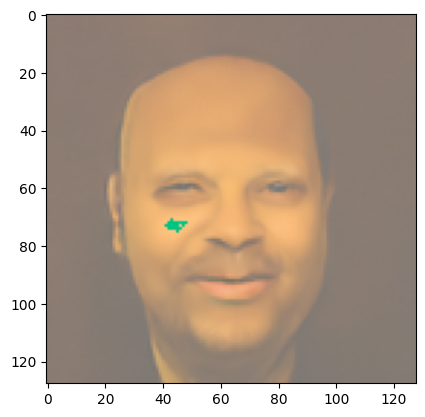

Epoch 1, step 950, loss 0.01288032061420381
Epoch 1, step 1000, loss 0.015006974413990974
Epoch 1, step 1050, loss 0.012083784127607942
Epoch 1, step 1100, loss 0.013344340650364757
Epoch 1, step 1150, loss 0.013867000062018632
Epoch 1, step 1200, loss 0.0140831215120852


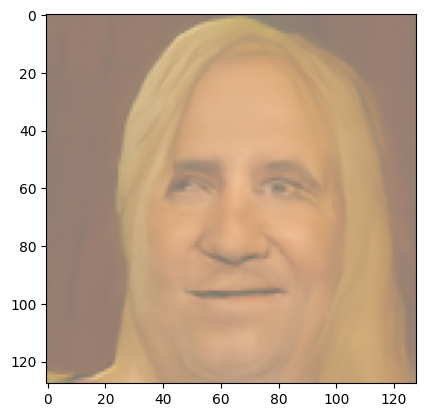

Epoch 1, step 1250, loss 0.012537074354477228
Epoch 1, step 1300, loss 0.013129641273990274
Epoch 1, step 1350, loss 0.014403622327372433
Epoch 1, step 1400, loss 0.012181343138217926
Epoch 1, step 1450, loss 0.013593049570918083
Epoch 1, step 1500, loss 0.01328710469417274


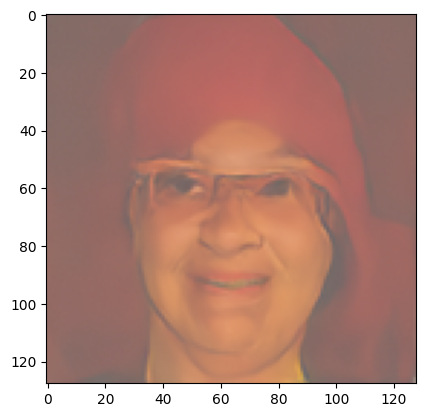

Epoch 1, step 1550, loss 0.01217339165508747
Epoch 1, step 1600, loss 0.012817916385829449
Epoch 1, step 1650, loss 0.014326385129243136
Epoch 1, step 1700, loss 0.012590044112876057
Epoch 1, step 1750, loss 0.014691115142777562
Epoch 1, step 1800, loss 0.012800437416881322


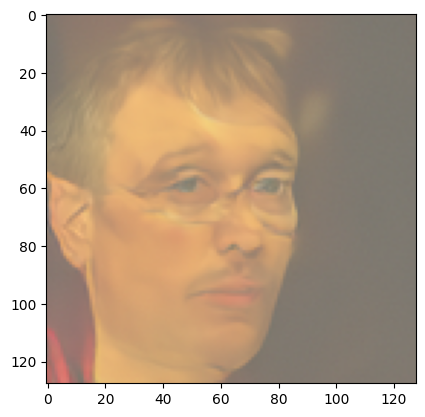

Epoch 1, step 1850, loss 0.012599823088385165
Epoch 1, step 1900, loss 0.012970120990648865
Epoch 1, step 1950, loss 0.012817242313176394
Epoch 1, step 2000, loss 0.011654052762314676
Epoch 1, step 2050, loss 0.012996814623475074
Epoch 1, step 2100, loss 0.014217414613813161


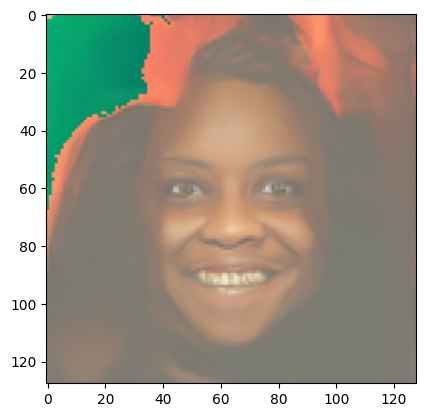

Epoch 1, step 2150, loss 0.013060858072713018
Epoch 1, step 2200, loss 0.012531585032120348
Epoch 1, step 2250, loss 0.01215488507412374
Epoch 1, step 2300, loss 0.012796167954802514
Epoch 1, step 2350, loss 0.013308931859210133
Epoch 1, step 2400, loss 0.012146748676896095


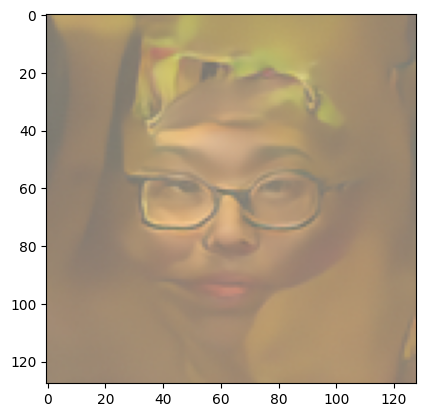

Epoch 1, step 2450, loss 0.012599963136017323
Epoch 1, step 2500, loss 0.0131512263789773
Epoch 1, step 2550, loss 0.012447141315788031
Epoch 1, step 2600, loss 0.014602567497640849
Epoch 1, step 2650, loss 0.013191145369783044


In [ ]:
optimizer = Adam(model.parameters(), lr = 2e-5)
epochs = 4
model.train()


for epoch in range(epochs):
    l = 0
    for step, batch in enumerate(data_loader):
        optimizer.zero_grad()
        t = torch.randint(0, timesteps, (batch_size,), device=device)
        x_noise, noise = get_noise(batch[0].to(device), t)
        pred = model(x_noise, t)
        output = loss(noise, pred)
        output.backward()
        optimizer.step()
        l += output.item()
        if step % 50 == 0:
            print("Epoch {}, step {}, loss {}".format(epoch, step, l/50))
            l = 0
        if step % 300 == 0:
            plot_image_full()
            model.train()
        if step % 1000 == 0:
            torch.save(model.state_dict(), "/content/drive/MyDrive/Colab Notebooks/diffusion_model_25-{}-{}".format(epoch, step))





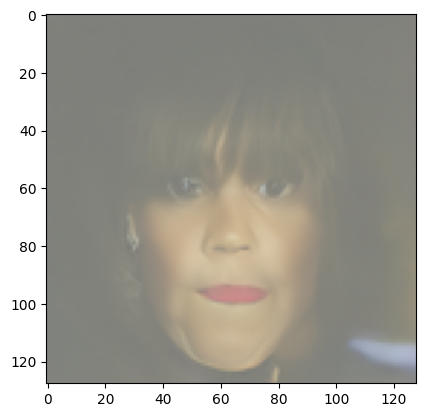

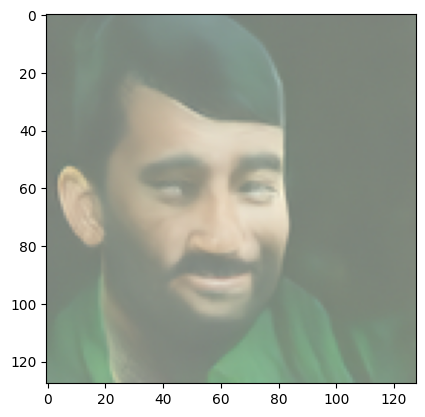

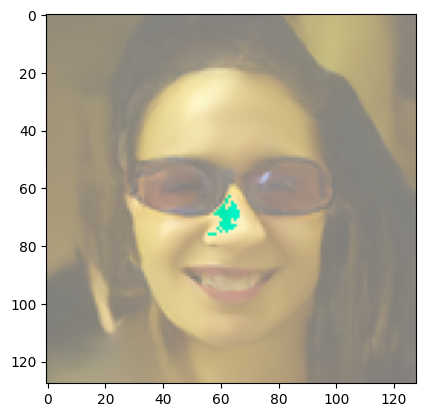

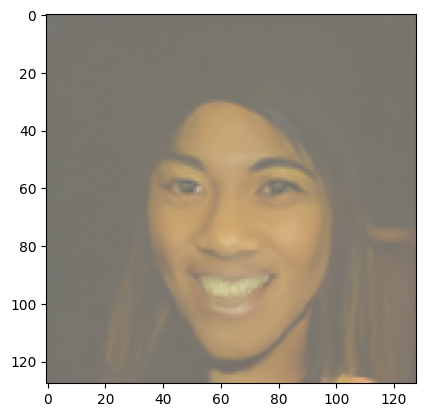

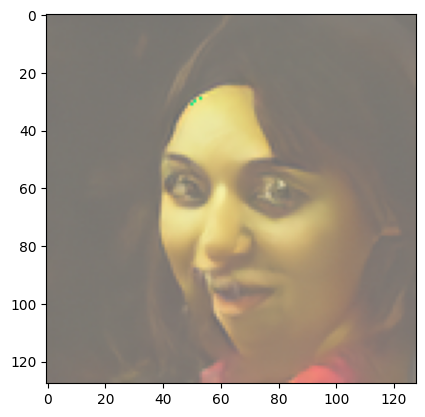

...

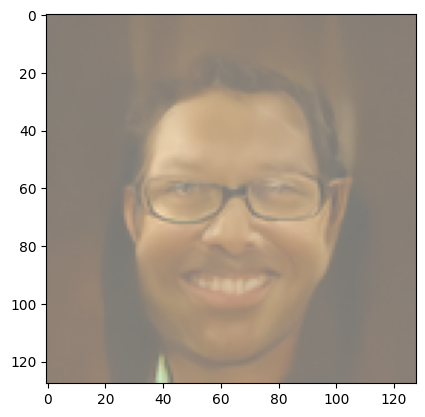

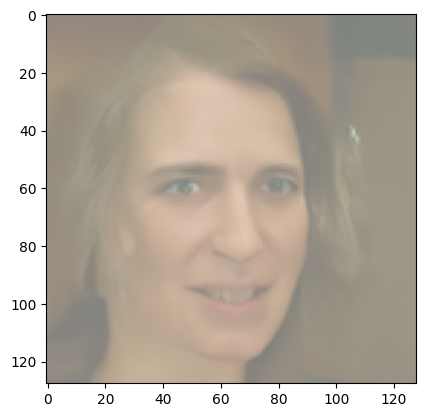

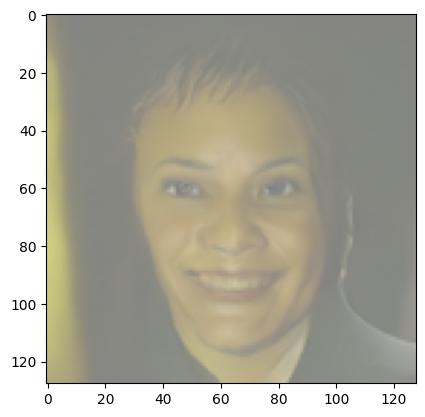

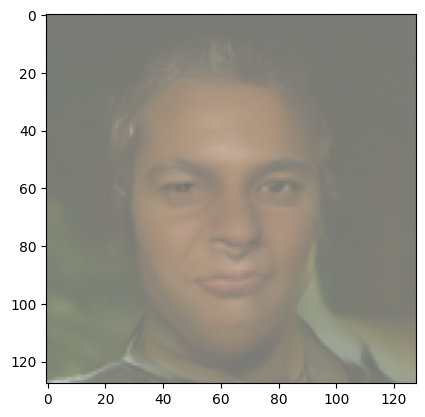

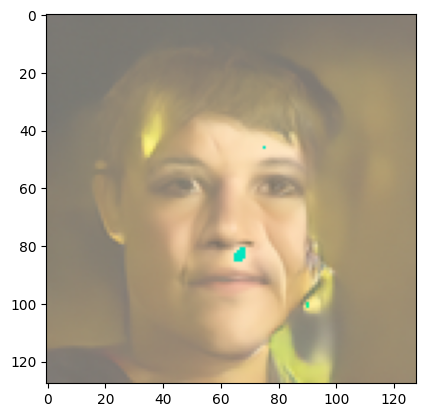

In [11]:
for _ in range(50):
    plot_image_full()